<a href="https://colab.research.google.com/github/gnoejh/ict1022/blob/main/Generative/diffusion.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Image Generation with HuggingFace Diffusion Models

This notebook demonstrates how to use various diffusion models from HuggingFace for image generation. 
It employs a modular approach with classes and configuration dictionaries for flexibility.

## Installing Required Libraries

First, let's install the necessary dependencies:

In [1]:
# Install required packages
%pip install diffusers transformers torch accelerate ftfy scipy safetensors pillow==9.5.0 invisible-watermark

Note: you may need to restart the kernel to use updated packages.


## Importing Libraries

In [2]:
# Import required libraries
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from diffusers import StableDiffusionPipeline, DiffusionPipeline
from diffusers import DDPMPipeline, DDIMPipeline
from PIL import Image
import time
import warnings
import logging

# Handle imports that might fail
try:
    from diffusers import StableDiffusionXLPipeline, StableDiffusionXLImg2ImgPipeline
    SDXL_AVAILABLE = True
except ImportError:
    print("StableDiffusionXL is not available. Some models will be disabled.")
    SDXL_AVAILABLE = False

# Suppress common warnings
warnings.filterwarnings("ignore", message=".*resume_download.*deprecated")
warnings.filterwarnings("ignore", message=".*safetensors not found")
warnings.filterwarnings("ignore", message=".*model.safetensors not found")

# Reduce logging verbosity
logging.getLogger("transformers").setLevel(logging.ERROR)
logging.getLogger("diffusers").setLevel(logging.ERROR)
logging.getLogger("huggingface_hub").setLevel(logging.ERROR)

c:\Users\hjeong\anaconda3\envs\py312sb3\Lib\site-packages\diffusers\utils\outputs.py:63: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  torch.utils._pytree._register_pytree_node(


In [3]:
# Define utility functions for checking model requirements
def check_dependencies(requirements):
    """Check if the required dependencies are available
    
    Args:
        requirements: Dictionary of requirements
        
    Returns:
        bool: True if all requirements are met, False otherwise
    """
    if requirements is None:
        return True
        
    for req_name, req_value in requirements.items():
        if req_name == "sdxl" and req_value and not SDXL_AVAILABLE:
            return False
            
    return True
    
def get_available_models(models_config):
    """Filter out models that don't meet requirements
    
    Args:
        models_config: Dictionary of model configurations
        
    Returns:
        dict: Dictionary of available models
    """
    available_models = {}
    
    for model_name, model_config in models_config.items():
        requirements = model_config.get("requires", None)
        
        if check_dependencies(requirements):
            available_models[model_name] = model_config
        else:
            print(f"Model {model_name} is not available due to missing dependencies.")
            
    return available_models

## Configuration Dictionary

Define configuration dictionary with models, parameters, device settings, and prompts.

In [4]:
# Configuration dictionary
config = {
    "device": "cuda" if torch.cuda.is_available() else "cpu",
    "output_dir": "./generated_images",
    
    "models": {
        "stable_diffusion_v1_5": {
            "model_id": "runwayml/stable-diffusion-v1-5",
            "pipeline_class": StableDiffusionPipeline,
            "requires": None,  # No special requirements
            "params": {
                "num_inference_steps": 50,
                "guidance_scale": 7.5,
                "height": 512,
                "width": 512
            }
        },
        "stable_diffusion_v2": {
            "model_id": "stabilityai/stable-diffusion-2-1",
            "pipeline_class": StableDiffusionPipeline,
            "requires": None,  # No special requirements
            "params": {
                "num_inference_steps": 50,
                "guidance_scale": 7.5,
                "height": 768,
                "width": 768
            }
        },
        "stable_diffusion_xl": {
            "model_id": "stabilityai/stable-diffusion-xl-base-1.0",
            "pipeline_class": StableDiffusionXLPipeline if SDXL_AVAILABLE else None,
            "requires": {"sdxl": True},  # Requires SDXL libraries
            "params": {
                "num_inference_steps": 30,
                "guidance_scale": 9.0,
                "height": 1024,
                "width": 1024
            }
        },
        "openjourney": {
            "model_id": "prompthero/openjourney",
            "pipeline_class": StableDiffusionPipeline,
            "requires": None,  # No special requirements
            "params": {
                "num_inference_steps": 50,
                "guidance_scale": 7.5,
                "height": 512,
                "width": 512
            }
        }
    },
    
    "prompts": {
        "landscape": "A beautiful mountain landscape with snow-capped peaks and a crystal clear lake, high quality, detailed, professional photography",
        "portrait": "A detailed portrait of a smiling astronaut in space, with Earth visible in the reflection of the helmet, hyper-realistic",
        "fantasy": "A magical forest with glowing mushrooms and fairy lights, fantasy art style, vibrant colors",
        "sci_fi": "A futuristic city with flying cars and holographic signs, cyberpunk style, neon lights"
    }
}

# Filter models to only include ones with available dependencies
config["models"] = get_available_models(config["models"])
print(f"Available models: {list(config['models'].keys())}")

# Create output directory if it doesn't exist
os.makedirs(config["output_dir"], exist_ok=True)

Available models: ['stable_diffusion_v1_5', 'stable_diffusion_v2', 'stable_diffusion_xl', 'openjourney']


## Diffusion Generator Class

Create a class for handling diffusion model generation.

In [5]:
class DiffusionGenerator:
    def __init__(self, model_config, device=None):
        """
        Initialize the diffusion generator with model configuration
        
        Args:
            model_config: Dictionary containing model details
            device: Device to use for inference ('cuda' or 'cpu')
        """
        self.model_config = model_config
        self.device = device if device else config["device"]
        self.model_id = model_config["model_id"]
        self.pipeline_class = model_config["pipeline_class"]
        self.params = model_config["params"]
        self.pipeline = None
        
        # Check if model is available
        if self.pipeline_class is None:
            raise ValueError(f"Pipeline class for model {self.model_id} is not available")
        
    def load_model(self):
        """
        Load the model pipeline
        """
        print(f"Loading model: {self.model_id}")
        
        # Define a list of loading strategies to try in order
        loading_strategies = [
            # Strategy 1: First try with safetensors and fp16 for CUDA
            {
                "torch_dtype": torch.float16 if self.device == "cuda" else torch.float32,
                "use_safetensors": True,
                "variant": "fp16" if self.device == "cuda" else None
            },
            # Strategy 2: Try without safetensors but with fp16 for CUDA
            {
                "torch_dtype": torch.float16 if self.device == "cuda" else torch.float32,
                "variant": "fp16" if self.device == "cuda" else None
            },
            # Strategy 3: Try without specifying variant
            {
                "torch_dtype": torch.float16 if self.device == "cuda" else torch.float32,
            },
            # Strategy 4: Final fallback to CPU and float32
            {
                "torch_dtype": torch.float32
            },
            # Strategy 5: Absolute minimal parameters
            {}
        ]
        
        # Try each loading strategy until one works
        exception_messages = []
        for i, strategy in enumerate(loading_strategies):
            try:
                print(f"Trying loading strategy {i+1}/{len(loading_strategies)}...")
                
                # Switch to CPU if we're on the last strategy
                if i == len(loading_strategies) - 2 and self.device == "cuda":
                    print("Falling back to CPU for next attempt")
                    self.device = "cpu"
                
                # Load the model with current strategy
                self.pipeline = self.pipeline_class.from_pretrained(
                    self.model_id,
                    **strategy
                )
                
                # If we get here, loading was successful
                print(f"Successfully loaded model with strategy {i+1}")
                break
                
            except Exception as e:
                error_msg = str(e)
                print(f"Strategy {i+1} failed: {error_msg}")
                exception_messages.append(error_msg)
                if i == len(loading_strategies) - 1:
                    print("All loading strategies failed. Last error:", error_msg)
                    raise RuntimeError(f"Failed to load model {self.model_id}")
        
        # Move model to device and optimize memory usage
        try:
            self.pipeline = self.pipeline.to(self.device)
        except Exception as e:
            print(f"Error moving model to {self.device}: {str(e)}")
            print("Falling back to CPU")
            self.device = "cpu"
            self.pipeline = self.pipeline.to("cpu")
        
        # Enable memory optimization if on CUDA
        if self.device == "cuda":
            try:
                self.pipeline.enable_attention_slicing()  # Enable attention slicing for memory optimization
                print("Enabled memory optimizations for CUDA")
            except Exception as e:
                print(f"Warning: Could not enable memory optimizations: {str(e)}")
        
        return self
    
    def unload_model(self):
        """
        Unload the model to free memory
        """
        if self.pipeline:
            del self.pipeline
            torch.cuda.empty_cache()
            self.pipeline = None
    
    def generate_image(self, prompt, negative_prompt=None, seed=None):
        """
        Generate an image based on prompt
        
        Args:
            prompt: Text prompt for image generation
            negative_prompt: Negative prompt to guide what not to generate
            seed: Random seed for reproducibility
            
        Returns:
            PIL Image object
        """
        if not self.pipeline:
            self.load_model()
            
        # Set generator for reproducibility if seed is provided
        generator = None
        if seed is not None:
            generator = torch.Generator(device=self.device).manual_seed(seed)
            
        start_time = time.time()
        
        # Generate image with error handling
        try:
            output = self.pipeline(
                prompt=prompt,
                negative_prompt=negative_prompt,
                generator=generator,
                **self.params
            )
            image = output.images[0]
            
            generation_time = time.time() - start_time
            print(f"Image generation took {generation_time:.2f} seconds")
            
            return image
        except RuntimeError as e:
            if "CUDA out of memory" in str(e):
                print("CUDA out of memory error. Trying with CPU...")
                # Try again on CPU if CUDA ran out of memory
                self.unload_model()
                self.device = "cpu"
                self.load_model()
                if seed is not None:
                    generator = torch.Generator(device=self.device).manual_seed(seed)
                output = self.pipeline(
                    prompt=prompt,
                    negative_prompt=negative_prompt,
                    generator=generator,
                    **self.params
                )
                image = output.images[0]
                generation_time = time.time() - start_time
                print(f"CPU image generation took {generation_time:.2f} seconds")
                return image
            else:
                raise
    
    def save_image(self, image, filename):
        """
        Save the generated image to disk
        
        Args:
            image: PIL Image object
            filename: Filename to save the image as
        """
        save_path = os.path.join(config["output_dir"], filename)
        image.save(save_path)
        print(f"Image saved to {save_path}")
        return save_path

## Image Generation Utility Functions

In [6]:
def display_image(image):
    """
    Display an image in the notebook
    
    Args:
        image: PIL Image object
    """
    plt.figure(figsize=(12, 12))
    plt.imshow(image)
    plt.axis('off')
    plt.show()

def compare_images(images, titles=None, figsize=(15, 10)):
    """
    Compare multiple images side by side
    
    Args:
        images: List of PIL Image objects
        titles: List of titles for each image
        figsize: Figure size tuple (width, height)
    """
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    
    if n == 1:
        axes = [axes]
        
    for i, (ax, img) in enumerate(zip(axes, images)):
        ax.imshow(img)
        ax.axis('off')
        if titles:
            ax.set_title(titles[i])
    
    plt.tight_layout()
    plt.show()

def generate_and_display(model_name, prompt, negative_prompt=None, seed=None):
    """
    Generate and display an image using specified model and prompt
    
    Args:
        model_name: Name of the model from config dictionary
        prompt: Text prompt for image generation
        negative_prompt: Negative prompt to guide what not to generate
        seed: Random seed for reproducibility
        
    Returns:
        PIL Image object or None if model not available
    """
    if model_name not in config["models"]:
        print(f"Model {model_name} is not available. Skipping.")
        return None
        
    model_config = config["models"][model_name]
    
    try:
        generator = DiffusionGenerator(model_config)
        
        image = generator.generate_image(prompt, negative_prompt, seed)
        
        # Create a cleaned filename
        prompt_short = prompt.split(",")[0][:30].strip().replace(" ", "_")
        filename = f"{model_name}_{prompt_short}.png"
        
        # Save the image
        save_path = generator.save_image(image, filename)
        
        # Display the image
        display_image(image)
        
        return image
        
    except Exception as e:
        print(f"Error generating image with model {model_name}: {str(e)}")
        return None
    
    finally:
        # Clean up to free memory
        try:
            generator.unload_model()
        except:
            pass

## Main Entry Point

Create a main function that runs the entire pipeline including all image generation examples.

In [7]:
def main():
    """
    Main function to demonstrate all diffusion model capabilities
    """
    print("Welcome to the Diffusion Models Image Generation Demo")
    print(f"Using device: {config['device']}")
    print(f"Available models: {list(config['models'].keys())}")
    print(f"Available prompt categories: {list(config['prompts'].keys())}")
    
    # Skip if no models are available
    if not config["models"]:
        print("No models available. Please check your dependencies.")
        return None
        
    all_generated_images = {}
    
    try:
        # 1. Test Stable Diffusion v1.5
        print("\n===== Testing Stable Diffusion v1.5 =====\n")
        landscape_prompt = config["prompts"]["landscape"]
        negative_prompt = "blurry, low quality, distorted, deformed"
        
        print(f"Generating image with prompt: {landscape_prompt}")
        sd_v1_5_image = generate_and_display(
            "stable_diffusion_v1_5", 
            landscape_prompt, 
            negative_prompt=negative_prompt,
            seed=42
        )
        if sd_v1_5_image:
            all_generated_images["sd_v1_5_landscape"] = sd_v1_5_image
        
        # 2. Test Stable Diffusion v2
        print("\n===== Testing Stable Diffusion v2 =====\n")
        sd_v2_image = generate_and_display(
            "stable_diffusion_v2",
            landscape_prompt,
            negative_prompt=negative_prompt,
            seed=42
        )
        if sd_v2_image:
            all_generated_images["sd_v2_landscape"] = sd_v2_image
        
        # 3. Test OpenJourney
        print("\n===== Testing OpenJourney =====\n")
        openjourney_prompt = "mdjrny-v4 " + landscape_prompt  # OpenJourney uses this prefix for best results
        openjourney_image = generate_and_display(
            "openjourney",
            openjourney_prompt,
            negative_prompt=negative_prompt,
            seed=42
        )
        if openjourney_image:
            all_generated_images["openjourney_landscape"] = openjourney_image
        
        # 4. Test different prompts with the same model
        print("\n===== Testing Different Prompts with Same Model =====\n")
        # Choose a model to test different prompts - use the first available one as default
        available_models = list(config["models"].keys())
        if available_models:
            model_name = available_models[0]  # Use first available model
            print(f"Using model: {model_name}")
            
            # Generate images for each prompt category
            prompt_images = []
            titles = []
            
            for prompt_name, prompt_text in list(config["prompts"].items())[:2]:  # Taking first 2 to avoid memory issues
                print(f"\nGenerating {prompt_name} image with {model_name}")
                image = generate_and_display(
                    model_name,
                    prompt_text,
                    negative_prompt=negative_prompt,
                    seed=42
                )
                if image is not None:
                    prompt_images.append(image)
                    titles.append(prompt_name)
                    all_generated_images[f"{model_name}_{prompt_name}"] = image
            
            # Compare the generated images for different prompts
            if len(prompt_images) > 1:
                print("\nComparing images generated with different prompts:")
                compare_images(prompt_images, titles)
        
        # 5. Fantasy prompt across different models
        print("\n===== Generating Fantasy Prompt Across Models =====\n")
        fantasy_prompt = config["prompts"]["fantasy"]
        
        # Choose a subset of models if memory is limited
        selected_models = list(config["models"].keys())[:2]  # Only first 2 models to avoid memory issues
        
        for model_name in selected_models:
            print(f"\nProcessing model: {model_name}")
            image = generate_and_display(
                model_name,
                fantasy_prompt,
                negative_prompt=negative_prompt,
                seed=42
            )
            if image is not None:
                all_generated_images[f"{model_name}_fantasy"] = image
        
        print("\nAll image generation completed successfully!")
        print(f"Total generated images: {len(all_generated_images)}")
        
    except Exception as e:
        print(f"Error during image generation: {str(e)}")
        import traceback
        traceback.print_exc()
        
    finally:
        # Clean up and free memory
        torch.cuda.empty_cache()
        
    return all_generated_images

Welcome to the Diffusion Models Image Generation Demo
Using device: cuda
Available models: ['stable_diffusion_v1_5', 'stable_diffusion_v2', 'stable_diffusion_xl', 'openjourney']
Available prompt categories: ['landscape', 'portrait', 'fantasy', 'sci_fi']

===== Testing Stable Diffusion v1.5 =====

Generating image with prompt: A beautiful mountain landscape with snow-capped peaks and a crystal clear lake, high quality, detailed, professional photography
Loading model: runwayml/stable-diffusion-v1-5
Trying loading strategy 1/5...


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

model.fp16.safetensors:   0%|          | 0.00/608M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

c:\Users\hjeong\anaconda3\envs\py312sb3\Lib\site-packages\diffusers\utils\outputs.py:63: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  torch.utils._pytree._register_pytree_node(


Successfully loaded model with strategy 1
Enabled memory optimizations for CUDA


  0%|          | 0/50 [00:00<?, ?it/s]

Image generation took 7.99 seconds
Image saved to ./generated_images\stable_diffusion_v1_5_A_beautiful_mountain_landscape.png


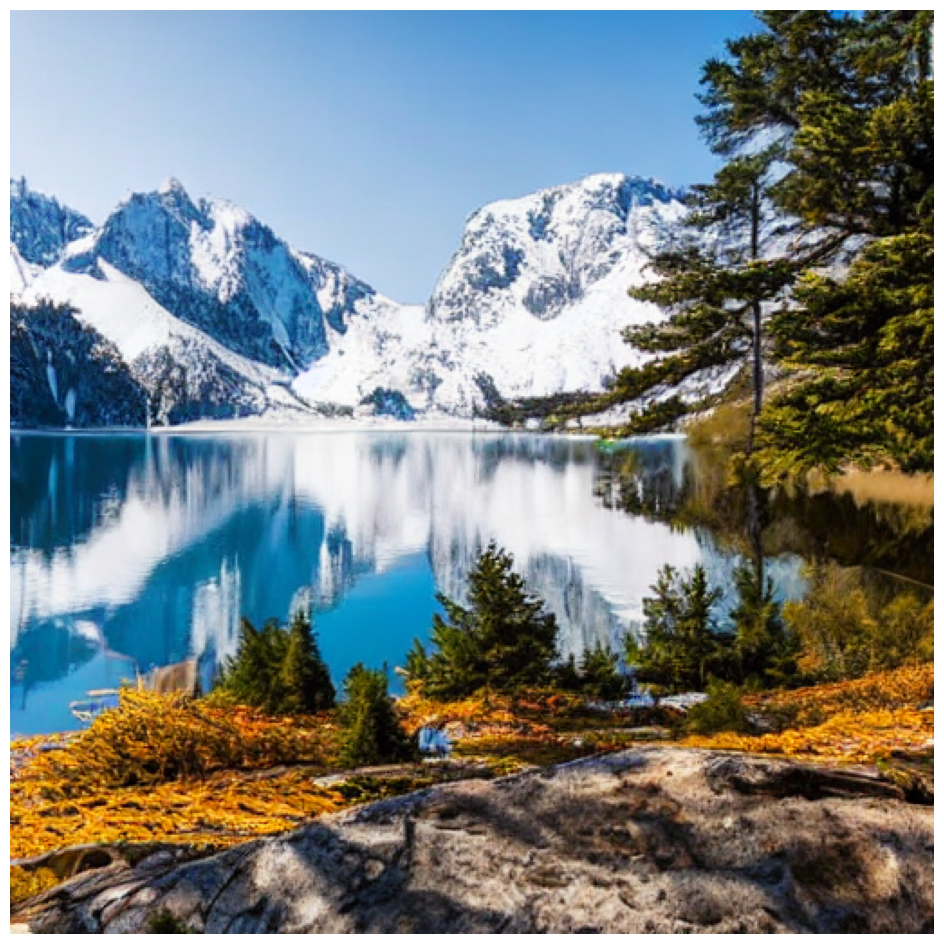


===== Testing Stable Diffusion v2 =====

Loading model: stabilityai/stable-diffusion-2-1
Trying loading strategy 1/5...


Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

model.fp16.safetensors:   0%|          | 0.00/681M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.fp16.safetensors:   0%|          | 0.00/1.73G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Successfully loaded model with strategy 1
Enabled memory optimizations for CUDA


  0%|          | 0/50 [00:00<?, ?it/s]

Image generation took 29.28 seconds
Image saved to ./generated_images\stable_diffusion_v2_A_beautiful_mountain_landscape.png


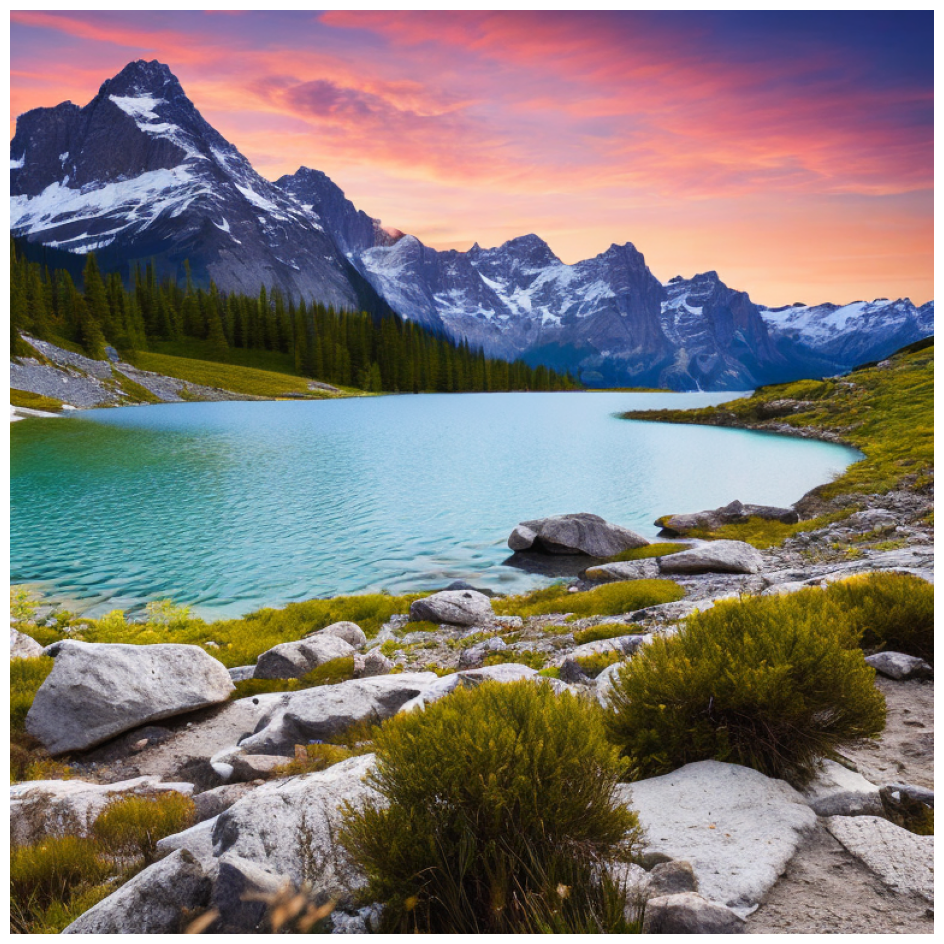


===== Testing OpenJourney =====

Loading model: prompthero/openjourney
Trying loading strategy 1/5...
Strategy 1 failed: The deprecation tuple ('no variant default', '0.24.0', "You are trying to load the model files of the `variant=fp16`, but no such modeling files are available.The default model files: {'vae/diffusion_pytorch_model.bin', 'safety_checker/pytorch_model.bin', 'unet/diffusion_pytorch_model.safetensors', 'vae/diffusion_pytorch_model.safetensors', 'text_encoder/pytorch_model.bin', 'unet/diffusion_pytorch_model.bin', 'text_encoder/model.safetensors', 'model.safetensors', 'safety_checker/model.safetensors'} will be loaded instead. Make sure to not load from `variant=fp16`if such variant modeling files are not available. Doing so will lead to an error in v0.24.0 as defaulting to non-variantmodeling files is deprecated.") should be removed since diffusers' version 0.24.0 is >= 0.24.0
Trying loading strategy 2/5...
Strategy 2 failed: The deprecation tuple ('no variant default',

Fetching 16 files:   0%|          | 0/16 [00:00<?, ?it/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Successfully loaded model with strategy 3
Enabled memory optimizations for CUDA


  0%|          | 0/50 [00:00<?, ?it/s]

Image generation took 7.52 seconds
Image saved to ./generated_images\openjourney_mdjrny-v4_A_beautiful_mountain.png


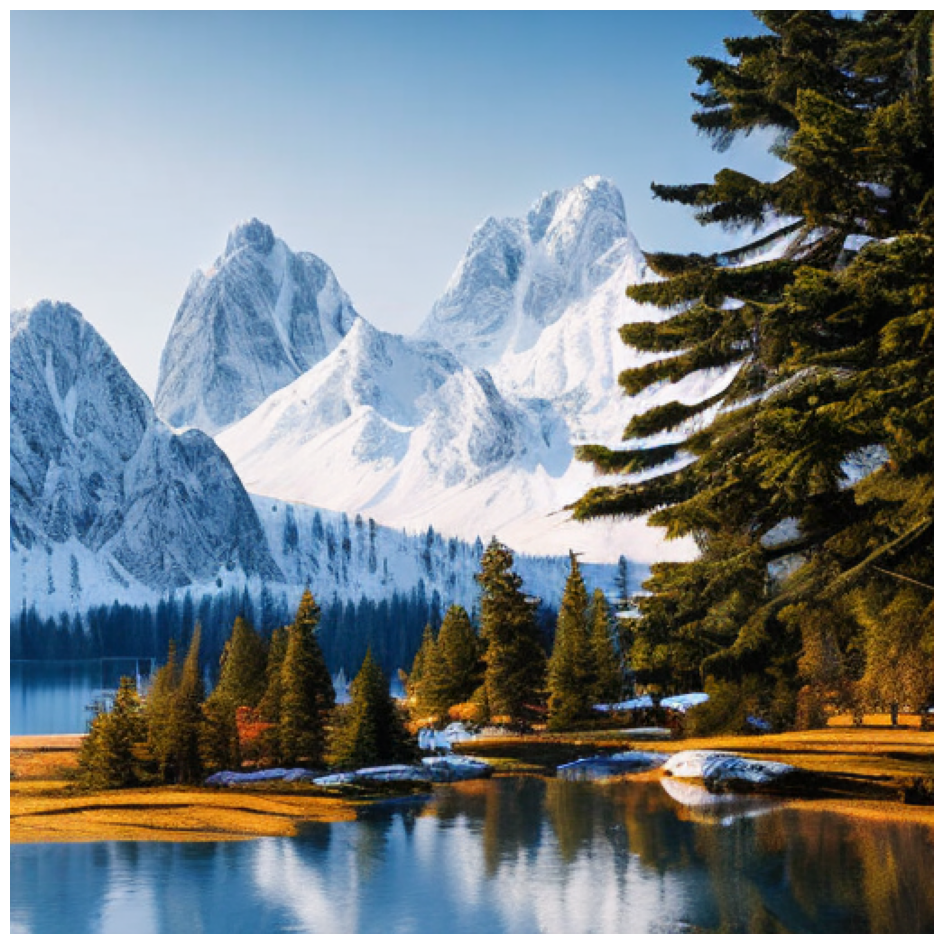


===== Testing Different Prompts with Same Model =====

Using model: stable_diffusion_v1_5

Generating landscape image with stable_diffusion_v1_5
Loading model: runwayml/stable-diffusion-v1-5
Trying loading strategy 1/5...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Successfully loaded model with strategy 1
Enabled memory optimizations for CUDA


  0%|          | 0/50 [00:00<?, ?it/s]

Image generation took 7.58 seconds
Image saved to ./generated_images\stable_diffusion_v1_5_A_beautiful_mountain_landscape.png


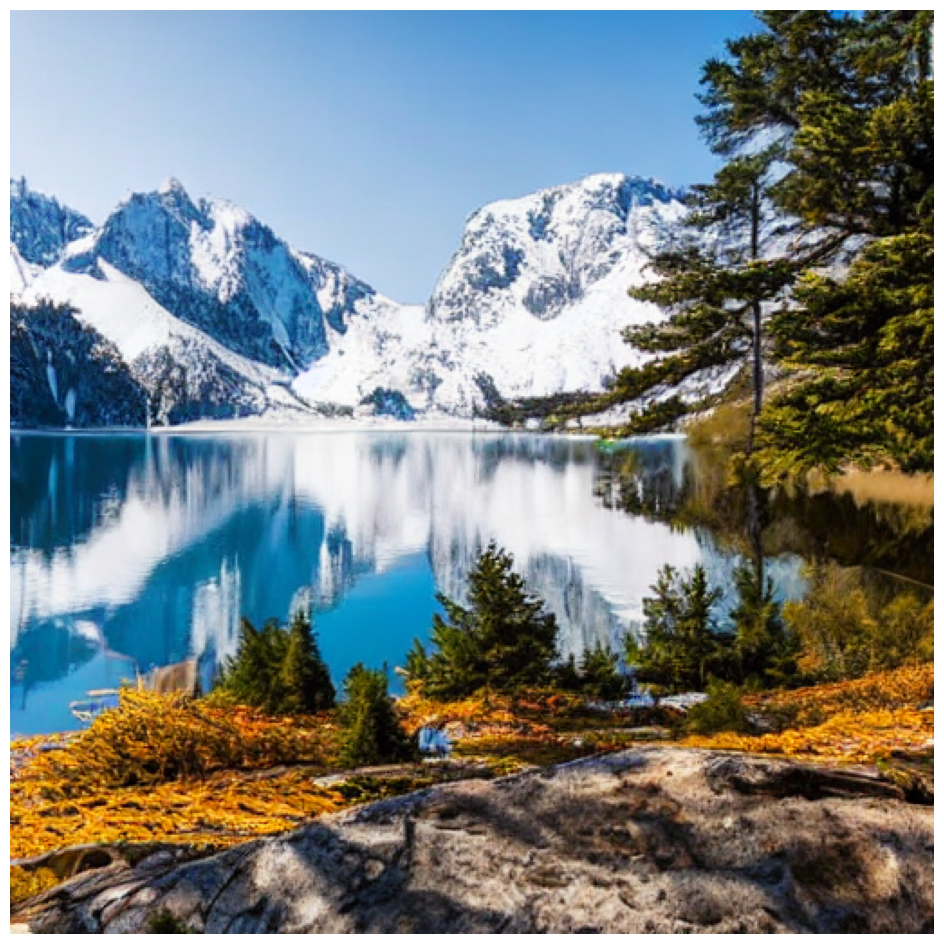


Generating portrait image with stable_diffusion_v1_5
Loading model: runwayml/stable-diffusion-v1-5
Trying loading strategy 1/5...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Successfully loaded model with strategy 1
Enabled memory optimizations for CUDA


  0%|          | 0/50 [00:00<?, ?it/s]

Image generation took 7.52 seconds
Image saved to ./generated_images\stable_diffusion_v1_5_A_detailed_portrait_of_a_smili.png


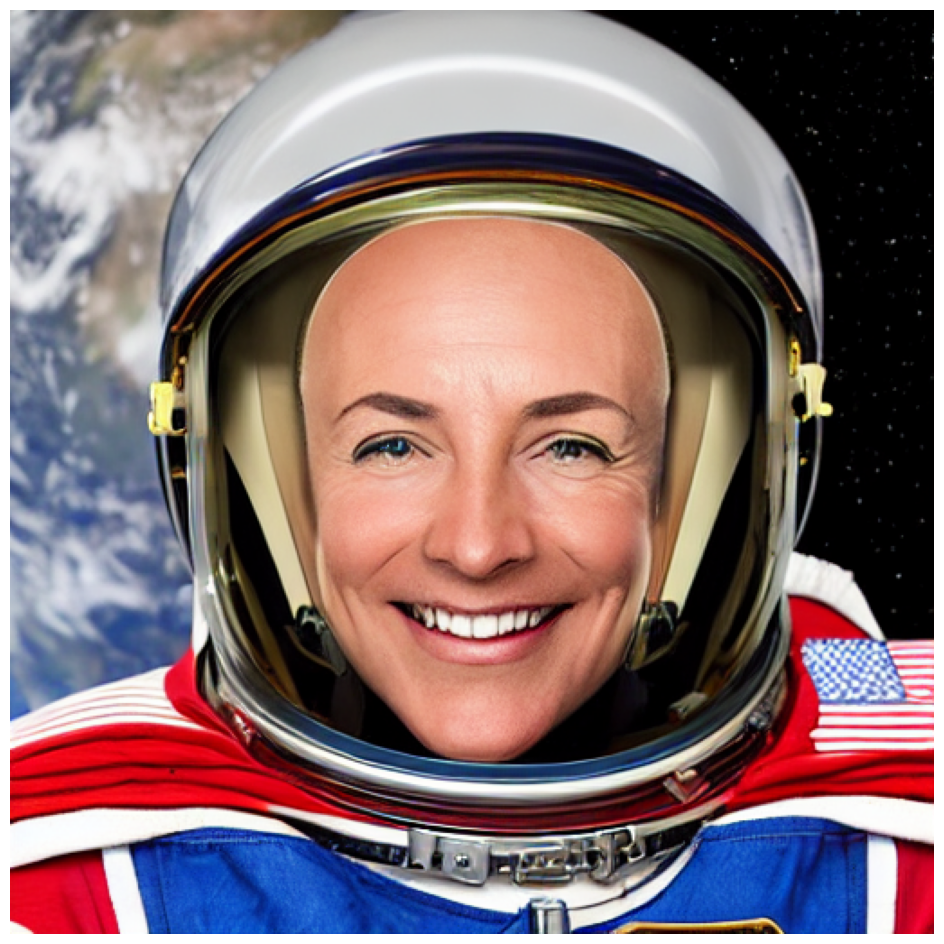


Comparing images generated with different prompts:


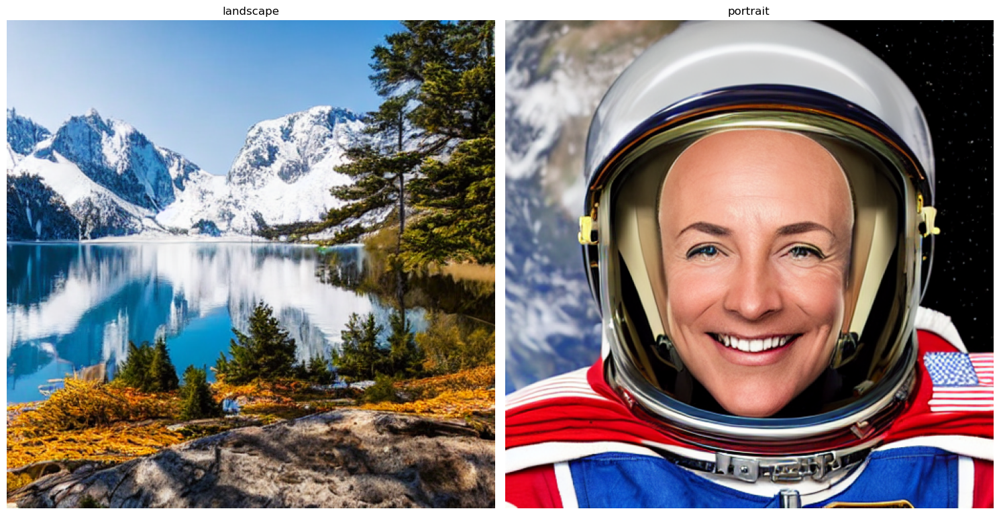


===== Generating Fantasy Prompt Across Models =====


Processing model: stable_diffusion_v1_5
Loading model: runwayml/stable-diffusion-v1-5
Trying loading strategy 1/5...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Successfully loaded model with strategy 1
Enabled memory optimizations for CUDA


  0%|          | 0/50 [00:00<?, ?it/s]

Image generation took 7.51 seconds
Image saved to ./generated_images\stable_diffusion_v1_5_A_magical_forest_with_glowing.png


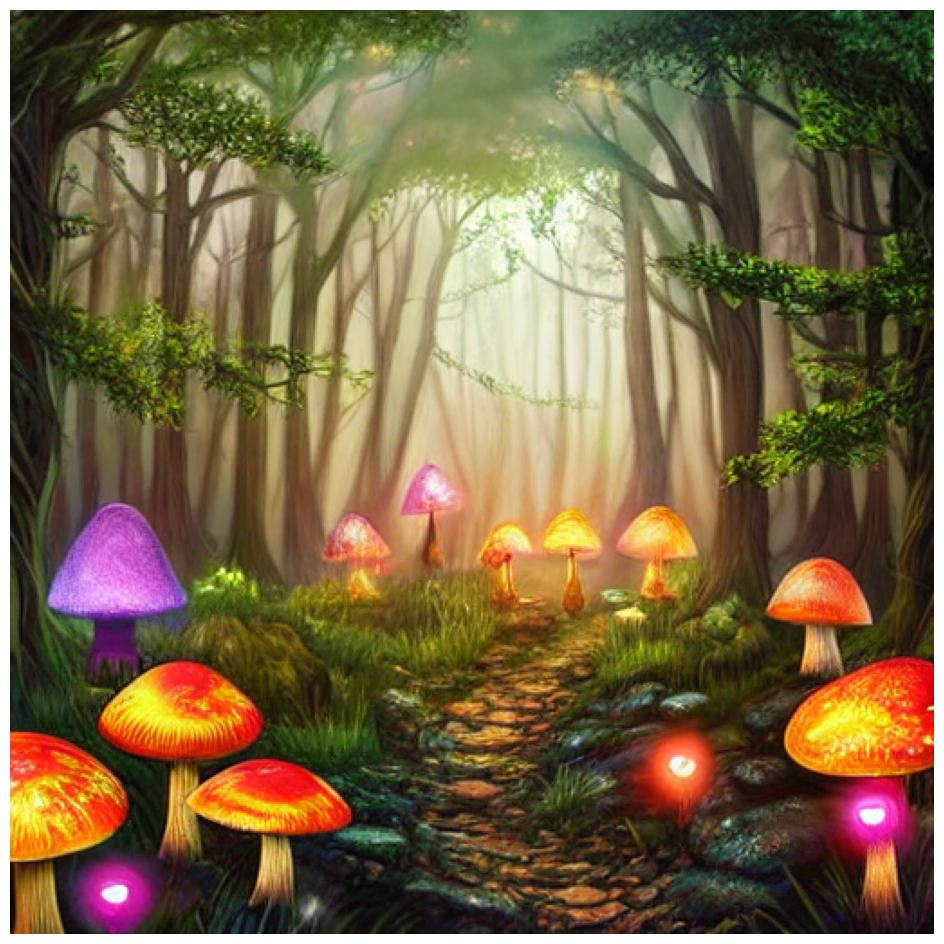


Processing model: stable_diffusion_v2
Loading model: stabilityai/stable-diffusion-2-1
Trying loading strategy 1/5...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Successfully loaded model with strategy 1
Enabled memory optimizations for CUDA


  0%|          | 0/50 [00:00<?, ?it/s]

Image generation took 29.26 seconds
Image saved to ./generated_images\stable_diffusion_v2_A_magical_forest_with_glowing.png


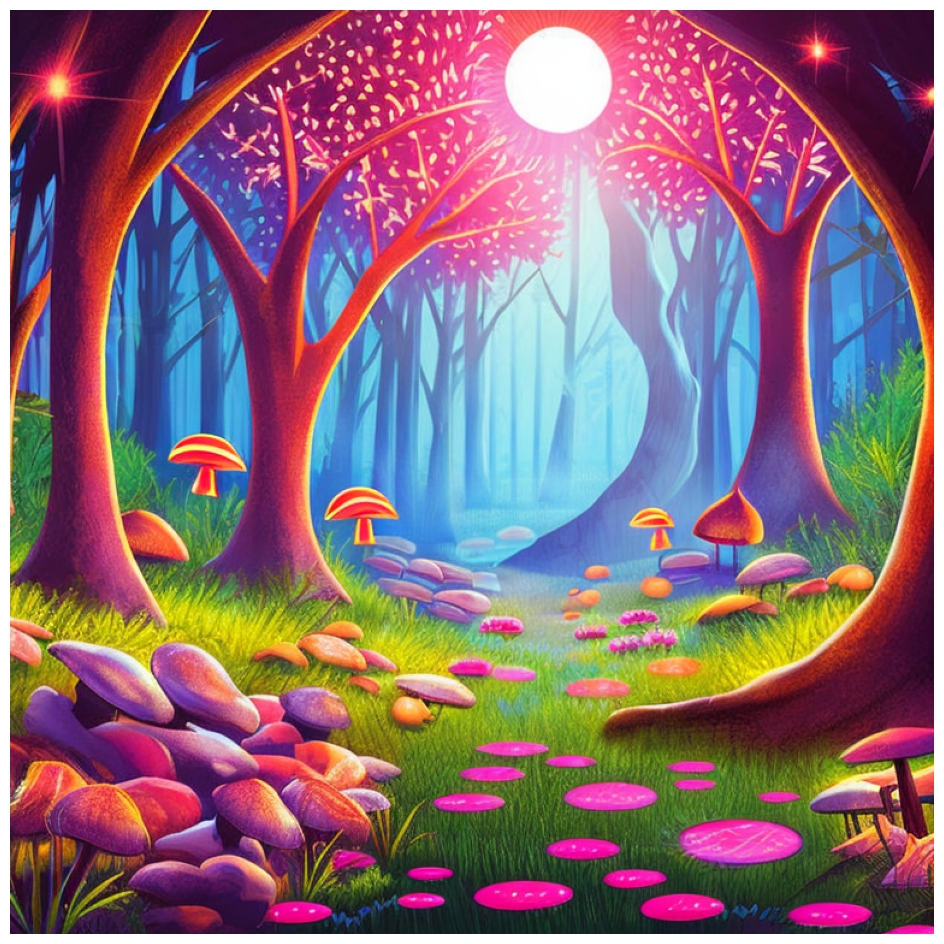


All image generation completed successfully!
Total generated images: 7


In [8]:
# Run the main function to generate all images
if __name__ == "__main__":
    results = main()

## Conclusion

In this notebook, we've created a modular framework for generating images using various diffusion models from HuggingFace. The key components include:

1. A configuration dictionary for models, parameters, and prompts
2. A DiffusionGenerator class for handling model loading and image generation
3. Utility functions for displaying and comparing images
4. A custom image generation function for user-defined parameters
5. A main entry point that centralizes all image generation examples
6. Error handling for model loading issues
7. Dependency checking to only use available models

This approach allows for easy experimentation with different models and parameters, and gracefully handles situations where certain models or dependencies are unavailable.

All image generation is now performed through the main() function, providing a single entry point for executing the entire pipeline.